In [79]:
import pandas as pd
import numpy as np

In [80]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the style of seaborn
sns.set(style="whitegrid")

In [81]:
train = pd.read_csv('train_storming_round.csv')
test = pd.read_csv('test_storming_round.csv')

# Feature Selection

In [82]:
train['target_column'] = [0 if i == 0 else 1 for i in train['new_policy_count']]
test['target_column'] = [0 if i == 0 else 1 for i in test['new_policy_count']]

In [83]:
train

,row_id,agent_code,agent_age,agent_join_month,first_policy_sold_month,year_month,unique_proposals_last_7_days,unique_proposals_last_15_days,unique_proposals_last_21_days,unique_proposal,...,unique_customers_last_7_days,unique_customers_last_15_days,unique_customers_last_21_days,unique_customers,new_policy_count,ANBP_value,net_income,number_of_policy_holders,number_of_cash_payment_policies,target_column
0,1,455ca878,45,2/1/2021,9/1/2023,1/1/2023,3,6,2,12,...,3,4,8,15,0,0,93313,30,162,0
1,2,c823ce77,48,4/1/2022,2/1/2024,1/1/2023,1,4,12,21,...,4,3,10,17,25,1071450,164804,0,175,1
2,3,62154055,53,5/1/2020,9/1/2023,1/1/2023,3,5,5,17,...,3,7,11,21,26,1601210,426690,84,78,1
3,4,c58bfa6e,44,7/1/2019,3/1/2022,1/1/2023,1,0,12,17,...,2,2,9,13,18,283230,47793,39,144,1
4,5,b1e5f770,20,9/1/2020,2/1/2023,1/1/2023,0,6,10,17,...,3,10,6,19,20,1957680,562239,19,40,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15303,15304,d3b44e44,43,4/1/2019,10/1/2023,8/1/2024,1,6,6,17,...,3,4,11,18,25,2473900,404980,18,100,1
15304,15305,0b1d7054,28,9/1/2022,3/1/2024,8/1/2024,1,5,3,13,...,4,3,11,18,15,922050,198187,18,120,1
15305,15306,51321fa2,45,1/1/2021,4/1/2024,8/1/2024,0,6,17,26,...,6,7,6,19,30,645330,133263,57,270,1
15306,15307,dd4a0d2d,25,12/1/2021,12/1/2023,8/1/2024,0,4,6,14,...,6,3,6,15,0,0,32546,30,171,0


In [84]:
# Separating year_month into year and month.
# year_month is in mm/dd/yyyy format
train['year'] = train['year_month'].apply(lambda x: int(x.split('/')[2]))
train['month'] = train['year_month'].apply(lambda x: int(x.split('/')[0]))

test['year'] = test['year_month'].apply(lambda x: int(x.split('/')[2]))
test['month'] = test['year_month'].apply(lambda x: int(x.split('/')[0]))


In [85]:
# Finding the number of months between agent_join_month and first_policy_sold_month
train['agent_join_month'] = train['agent_join_month'].apply(lambda x: int(x.split('/')[0])) + train['agent_join_month'].apply(lambda x: int(x.split('/')[2])) * 12 
train['first_policy_sold_month'] = train['first_policy_sold_month'].apply(lambda x: int(x.split('/')[0])) + train['first_policy_sold_month'].apply(lambda x: int(x.split('/')[2])) * 12
train['months_between'] = train['first_policy_sold_month'] - train['agent_join_month']

In [86]:
train

,row_id,agent_code,agent_age,agent_join_month,first_policy_sold_month,year_month,unique_proposals_last_7_days,unique_proposals_last_15_days,unique_proposals_last_21_days,unique_proposal,...,unique_customers,new_policy_count,ANBP_value,net_income,number_of_policy_holders,number_of_cash_payment_policies,target_column,year,month,months_between
0,1,455ca878,45,24254,24285,1/1/2023,3,6,2,12,...,15,0,0,93313,30,162,0,2023,1,31
1,2,c823ce77,48,24268,24290,1/1/2023,1,4,12,21,...,17,25,1071450,164804,0,175,1,2023,1,22
2,3,62154055,53,24245,24285,1/1/2023,3,5,5,17,...,21,26,1601210,426690,84,78,1,2023,1,40
3,4,c58bfa6e,44,24235,24267,1/1/2023,1,0,12,17,...,13,18,283230,47793,39,144,1,2023,1,32
4,5,b1e5f770,20,24249,24278,1/1/2023,0,6,10,17,...,19,20,1957680,562239,19,40,1,2023,1,29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15303,15304,d3b44e44,43,24232,24286,8/1/2024,1,6,6,17,...,18,25,2473900,404980,18,100,1,2024,8,54
15304,15305,0b1d7054,28,24273,24291,8/1/2024,1,5,3,13,...,18,15,922050,198187,18,120,1,2024,8,18
15305,15306,51321fa2,45,24253,24292,8/1/2024,0,6,17,26,...,19,30,645330,133263,57,270,1,2024,8,39
15306,15307,dd4a0d2d,25,24264,24288,8/1/2024,0,4,6,14,...,15,0,0,32546,30,171,0,2024,8,24


In [87]:
test['agent_join_month'] = test['agent_join_month'].apply(lambda x: int(x.split('/')[0])) + test['agent_join_month'].apply(lambda x: int(x.split('/')[2])) * 12
test['first_policy_sold_month'] = test['first_policy_sold_month'].apply(lambda x: int(x.split('/')[0])) + test['first_policy_sold_month'].apply(lambda x: int(x.split('/')[2])) * 12    
test['months_between'] = test['first_policy_sold_month'] - test['agent_join_month']

In [88]:
columns_to_drop = ['year_month', 'agent_join_month', 'first_policy_sold_month', 'new_policy_count', 'agent_code', 'row_id']

In [89]:
train.drop(columns=columns_to_drop, inplace=True)
test.drop(columns=columns_to_drop, inplace=True)

In [90]:
train

,agent_age,unique_proposals_last_7_days,unique_proposals_last_15_days,unique_proposals_last_21_days,unique_proposal,unique_quotations_last_7_days,unique_quotations_last_15_days,unique_quotations_last_21_days,unique_quotations,unique_customers_last_7_days,...,unique_customers_last_21_days,unique_customers,ANBP_value,net_income,number_of_policy_holders,number_of_cash_payment_policies,target_column,year,month,months_between
0,45,3,6,2,12,3,0,4,9,3,...,8,15,0,93313,30,162,0,2023,1,31
1,48,1,4,12,21,3,1,8,14,4,...,10,17,1071450,164804,0,175,1,2023,1,22
2,53,3,5,5,17,1,6,5,14,3,...,11,21,1601210,426690,84,78,1,2023,1,40
3,44,1,0,12,17,1,1,5,11,2,...,9,13,283230,47793,39,144,1,2023,1,32
4,20,0,6,10,17,3,6,2,13,3,...,6,19,1957680,562239,19,40,1,2023,1,29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15303,43,1,6,6,17,1,2,5,10,3,...,11,18,2473900,404980,18,100,1,2024,8,54
15304,28,1,5,3,13,2,3,8,14,4,...,11,18,922050,198187,18,120,1,2024,8,18
15305,45,0,6,17,26,4,6,3,22,6,...,6,19,645330,133263,57,270,1,2024,8,39
15306,25,0,4,6,14,4,1,5,13,6,...,6,15,0,32546,30,171,0,2024,8,24


# Understanding Relationships

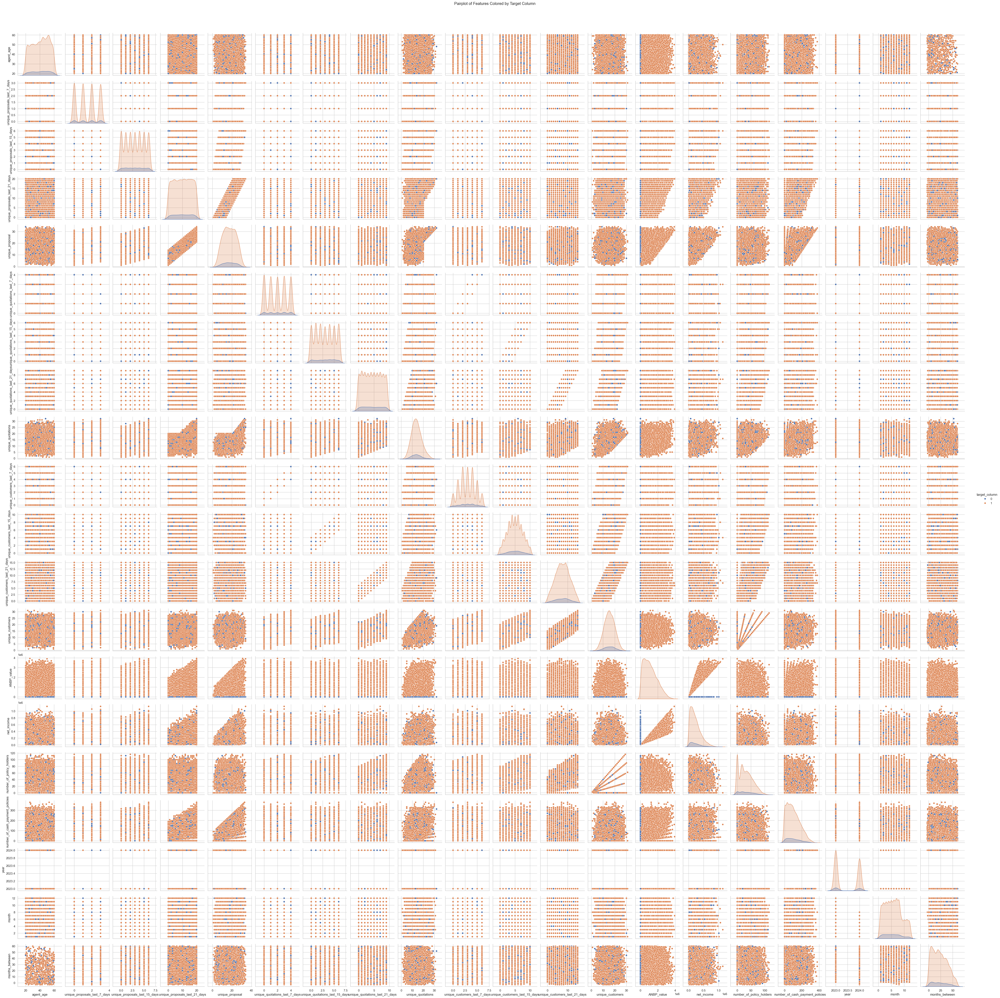

In [91]:
# Draw a pairplot to visualize the relationships between the features
sns.pairplot(train, hue='target_column', diag_kind='kde')
plt.suptitle('Pairplot of Features Colored by Target Column', y=1.02)
plt.show()

We can see that lower ANBP_value leads to having 0 in target column.

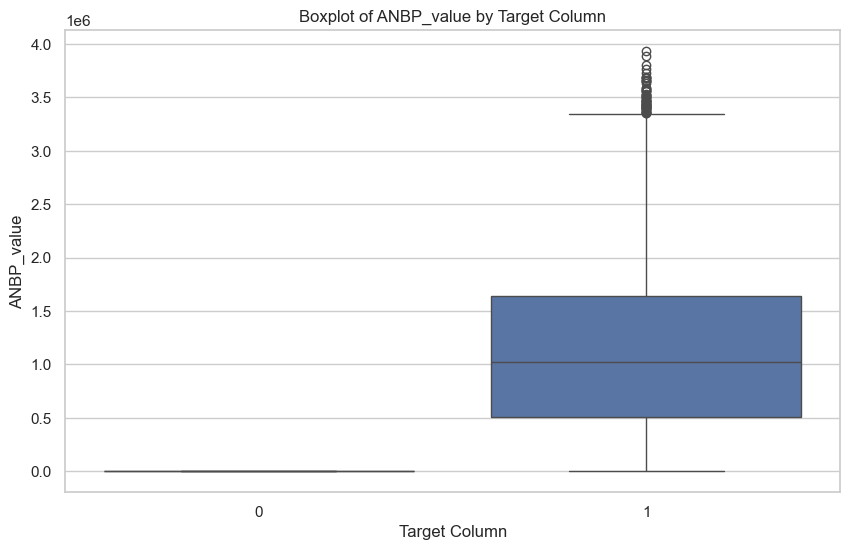

In [92]:
# Visualizing the relationship between the ANBP_value and the target column
plt.figure(figsize=(10, 6))
sns.boxplot(x='target_column', y='ANBP_value', data=train)
plt.title('Boxplot of ANBP_value by Target Column')
plt.xlabel('Target Column')
plt.ylabel('ANBP_value')
plt.show()

In [93]:
# Let's see the rows where ANBP_value is 0
zero_anbp = train[train['ANBP_value'] == 0]
zero_anbp = zero_anbp[['target_column', 'ANBP_value']]
zero_anbp['target_column'].value_counts()

target_column
0    1530
Name: count, dtype: int64

In [94]:
non_zero_anbp = train[train['ANBP_value'] != 0]
non_zero_anbp = non_zero_anbp[['target_column', 'ANBP_value']]
non_zero_anbp['target_column'].value_counts()

target_column
1    13778
Name: count, dtype: int64

In [95]:
zero_anbp['ANBP_value'].value_counts()

ANBP_value
0    1530
Name: count, dtype: int64

In [96]:
non_zero_anbp['ANBP_value'].value_counts()

ANBP_value
928620     3
1389960    3
503360     2
472560     2
1515117    2
          ..
264576     1
688068     1
1099539    1
1135060    1
1726568    1
Name: count, Length: 13671, dtype: int64

In [97]:
non_zero_anbp['ANBP_value'].min()

6035

This shows that ANBP value of 0 means target column of 0

In [98]:
test_new = pd.read_csv('test_storming_round.csv')

In [99]:
test_new['target_column'] = [0 if i == 0 else 1 for i in test_new['ANBP_value']]

In [ ]:
submission_2 = test_new[['row_id', 'target_column']]
submission_2['target_column'] = submission_2['target_column'].astype(int)
submission_2.to_csv('submission.csv', index=False)

C:\Users\gayka\AppData\Local\Temp\ipykernel_18520\1877272951.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  submission_2['target_column'] = submission_2['target_column'].astype(int)


The accuracy was 0.89588. Let's see whether we can improve that.

# Mutual Information

In [101]:
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(train.drop(columns=['target_column']), train['target_column'], test_size=0.2, random_state=42, stratify=train['target_column'])

In [102]:
x_train.shape, x_test.shape, y_train.shape, y_test.shape

((12246, 20), (3062, 20), (12246,), (3062,))

In [103]:
from sklearn.feature_selection import mutual_info_classif

MI = mutual_info_classif(x_train, y_train)

In [104]:
MI

array([3.82462371e-03, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       2.65470195e-03, 7.31025092e-04, 2.13419414e-03, 7.88949678e-03,
       2.31225196e-04, 3.25016141e-01, 3.47772393e-03, 0.00000000e+00,
       0.00000000e+00, 4.61921991e-03, 4.38004289e-04, 6.18886370e-04])

In [105]:
y_train.value_counts()

target_column
1    11022
0     1224
Name: count, dtype: int64

In [106]:
y_test.value_counts()

target_column
1    2756
0     306
Name: count, dtype: int64

In [107]:
MI = pd.Series(MI, index=x_train.columns)
MI = MI.sort_values(ascending=False)

In [108]:
MI

ANBP_value                         0.325016
unique_customers_last_21_days      0.007889
year                               0.004619
agent_age                          0.003825
net_income                         0.003478
unique_quotations                  0.002655
unique_customers_last_15_days      0.002134
unique_customers_last_7_days       0.000731
months_between                     0.000619
month                              0.000438
unique_customers                   0.000231
unique_quotations_last_21_days     0.000000
unique_quotations_last_15_days     0.000000
unique_proposals_last_7_days       0.000000
unique_quotations_last_7_days      0.000000
unique_proposal                    0.000000
unique_proposals_last_21_days      0.000000
number_of_policy_holders           0.000000
number_of_cash_payment_policies    0.000000
unique_proposals_last_15_days      0.000000
dtype: float64

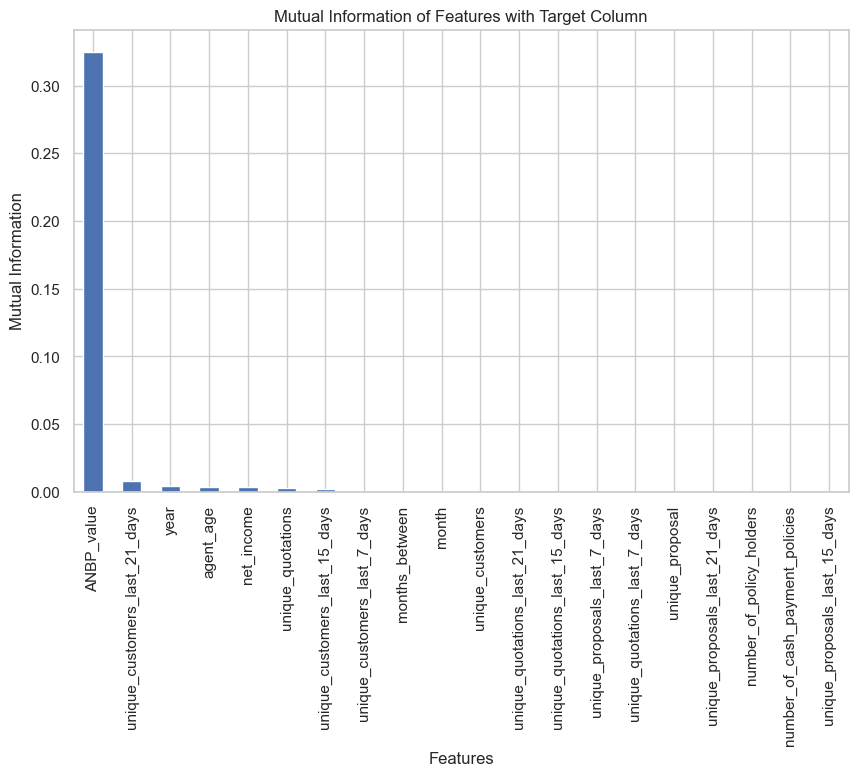

In [109]:
MI.sort_values(ascending=False).plot.bar(figsize=(10, 6))
plt.title('Mutual Information of Features with Target Column')
plt.xlabel('Features')
plt.ylabel('Mutual Information')
plt.show()

In [110]:
# Getting the top 7 features based on mutual information
top_features = MI.sort_values(ascending=False).head(7).index.tolist()
top_features

['ANBP_value',
 'unique_customers_last_21_days',
 'year',
 'agent_age',
 'net_income',
 'unique_quotations',
 'unique_customers_last_15_days']

In [111]:
train_copy = train[top_features + ['target_column']].copy()
train_copy['target_column'] = train_copy['target_column'].astype(int)
train_copy['target_column'].value_counts()

target_column
1    13778
0     1530
Name: count, dtype: int64

In [112]:
train_copy

,ANBP_value,unique_customers_last_21_days,year,agent_age,net_income,unique_quotations,unique_customers_last_15_days,target_column
0,0,8,2023,45,93313,9,4,0
1,1071450,10,2023,48,164804,14,3,1
2,1601210,11,2023,53,426690,14,7,1
3,283230,9,2023,44,47793,11,2,1
4,1957680,6,2023,20,562239,13,10,1
...,...,...,...,...,...,...,...,...
15303,2473900,11,2024,43,404980,10,4,1
15304,922050,11,2024,28,198187,14,3,1
15305,645330,6,2024,45,133263,22,7,1
15306,0,6,2024,25,32546,13,3,0


In [113]:
# Create a decision tree classifier
x_train, x_valid, y_train, y_valid = train_test_split(train_copy.drop(columns=['target_column']), train_copy['target_column'], test_size=0.2, random_state=42, stratify=train_copy['target_column'])
from sklearn.tree import DecisionTreeClassifier

dt = DecisionTreeClassifier(random_state=42, max_depth=3)
dt.fit(x_train, y_train)

# Predict on the validation set
y_pred = dt.predict(x_valid)
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import accuracy_score

# Print the classification report
print(classification_report(y_valid, y_pred))
print(confusion_matrix(y_valid, y_pred))

print(accuracy_score(y_valid, y_pred))


              precision    recall  f1-score   support

           0       1.00      1.00      1.00       306
           1       1.00      1.00      1.00      2756

    accuracy                           1.00      3062
   macro avg       1.00      1.00      1.00      3062
weighted avg       1.00      1.00      1.00      3062

[[ 306    0]
 [   1 2755]]
0.9996734160679295


In [ ]:
# Presict on the test set
y_test_pred = dt.predict(test[top_features])
submission = test_new[['row_id']].copy()
submission['target_column'] = y_test_pred
submission['target_column'] = submission['target_column'].astype(int)
submission.to_csv('submission0.csv', index=False)

# Check the submission file
submission.head()
submission['target_column'].value_counts()

target_column
1    820
0     94
Name: count, dtype: int64

In [115]:
# Show the difference between submission 2 and submission 3
submission_2 = pd.read_csv('submission_2.csv')
submission_2['target_column'].value_counts()



target_column
1    820
0     94
Name: count, dtype: int64

In [116]:
submission_3 = pd.read_csv('submission3.csv')
submission_3['target_column'].value_counts()

target_column
1    820
0     94
Name: count, dtype: int64

Accuracy did not increase. Let's try without using ANBP value.

In [117]:
# Lets use top features excluding ANBP_value
top_features = MI.sort_values(ascending=False).head(7).index.tolist()
top_features.remove('ANBP_value')
top_features

['unique_customers_last_21_days',
 'year',
 'agent_age',
 'net_income',
 'unique_quotations',
 'unique_customers_last_15_days']

In [118]:
# Use the top features to train the model again
x_train, x_valid, y_train, y_valid = train_test_split(train_copy[top_features], train_copy['target_column'], test_size=0.2, random_state=42, stratify=train_copy['target_column'])

dt1 = DecisionTreeClassifier(random_state=42, max_depth=3)
dt1.fit(x_train, y_train)

y_pred = dt1.predict(x_valid)

print(classification_report(y_valid, y_pred))
print(confusion_matrix(y_valid, y_pred))
print(accuracy_score(y_valid, y_pred))



              precision    recall  f1-score   support

           0       0.00      0.00      0.00       306
           1       0.90      1.00      0.95      2756

    accuracy                           0.90      3062
   macro avg       0.45      0.50      0.47      3062
weighted avg       0.81      0.90      0.85      3062

[[   0  306]
 [   1 2755]]
0.8997387328543436


This model does not recognize 0 

# Using PCA

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [120]:
train

,agent_age,unique_proposals_last_7_days,unique_proposals_last_15_days,unique_proposals_last_21_days,unique_proposal,unique_quotations_last_7_days,unique_quotations_last_15_days,unique_quotations_last_21_days,unique_quotations,unique_customers_last_7_days,...,unique_customers_last_21_days,unique_customers,ANBP_value,net_income,number_of_policy_holders,number_of_cash_payment_policies,target_column,year,month,months_between
0,45,3,6,2,12,3,0,4,9,3,...,8,15,0,93313,30,162,0,2023,1,31
1,48,1,4,12,21,3,1,8,14,4,...,10,17,1071450,164804,0,175,1,2023,1,22
2,53,3,5,5,17,1,6,5,14,3,...,11,21,1601210,426690,84,78,1,2023,1,40
3,44,1,0,12,17,1,1,5,11,2,...,9,13,283230,47793,39,144,1,2023,1,32
4,20,0,6,10,17,3,6,2,13,3,...,6,19,1957680,562239,19,40,1,2023,1,29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15303,43,1,6,6,17,1,2,5,10,3,...,11,18,2473900,404980,18,100,1,2024,8,54
15304,28,1,5,3,13,2,3,8,14,4,...,11,18,922050,198187,18,120,1,2024,8,18
15305,45,0,6,17,26,4,6,3,22,6,...,6,19,645330,133263,57,270,1,2024,8,39
15306,25,0,4,6,14,4,1,5,13,6,...,6,15,0,32546,30,171,0,2024,8,24


In [121]:
scaling = StandardScaler()
train_scaled = scaling.fit_transform(train.drop(columns=['target_column']))

principal = PCA(n_components=3)
principal.fit(train_scaled)
principal_components = principal.transform(train_scaled)

In [122]:
principal_components.shape

(15308, 3)

In [123]:
principal_components

array([[-1.53621185, -0.72227125,  0.38718042],
       [ 0.69862505,  0.21035995,  1.09112267],
       [ 1.80668305, -1.18556033, -0.02080109],
       ...,
       [ 2.98573192,  0.2028295 , -2.53402397],
       [-0.81761063, -0.97994325, -0.7409623 ],
       [-1.3965951 ,  0.63203624, -1.95751063]])

In [124]:
principal.components_

array([[ 1.23919122e-04,  5.93452905e-02,  9.87786376e-02,
         3.10469997e-01,  3.33369734e-01,  1.63343300e-01,
         1.89590213e-01,  2.69012025e-01,  4.29413151e-01,
         1.67836944e-01,  1.97864021e-01,  2.76669985e-01,
         3.78259118e-01,  2.27767859e-01,  2.29712388e-01,
         1.89963054e-01,  1.79185649e-01, -3.73484815e-03,
         3.11275464e-04,  2.48224961e-03],
       [-3.98698033e-03,  5.81012169e-02,  1.31678119e-01,
         3.57354485e-01,  3.88143327e-01, -1.36009989e-01,
        -1.71785232e-01, -2.73272050e-01,  5.24087116e-02,
        -1.41382247e-01, -1.92988683e-01, -3.03370254e-01,
        -3.86454770e-01,  3.03009435e-01,  3.07891604e-01,
        -2.02295694e-01,  2.21670752e-01,  5.94441261e-03,
        -1.07081101e-02,  6.38638904e-03],
       [ 8.72521828e-03,  6.34583847e-04,  1.45324736e-02,
         7.63026154e-03,  9.43781320e-03, -3.83172243e-01,
        -3.82088041e-01,  4.58087143e-01,  5.73013744e-03,
        -3.81113086e-01, -3.7

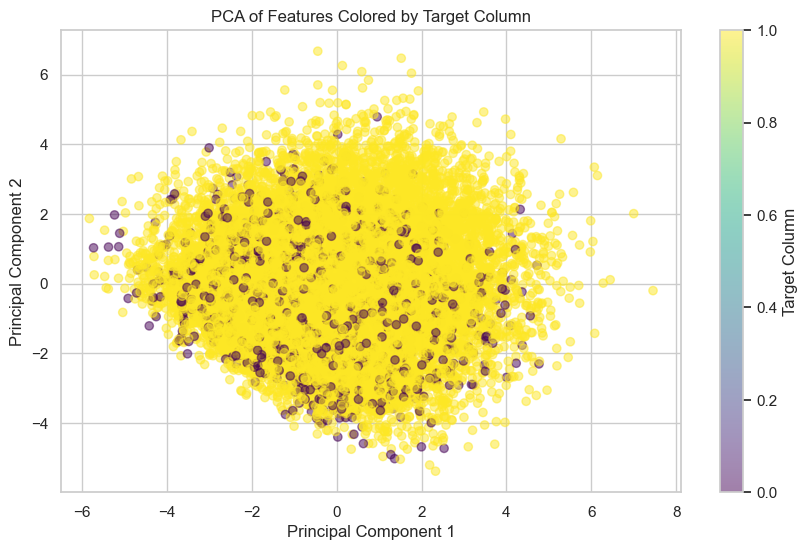

In [125]:
plt.figure(figsize=(10, 6))
plt.scatter(principal_components[:, 0], principal_components[:, 1], c=train['target_column'], cmap='viridis', alpha=0.5)
plt.title('PCA of Features Colored by Target Column')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.colorbar(label='Target Column')
plt.show()

RuntimeError: No mappable was found to use for colorbar creation. First define a mappable such as an image (with imshow) or a contour set (with contourf).

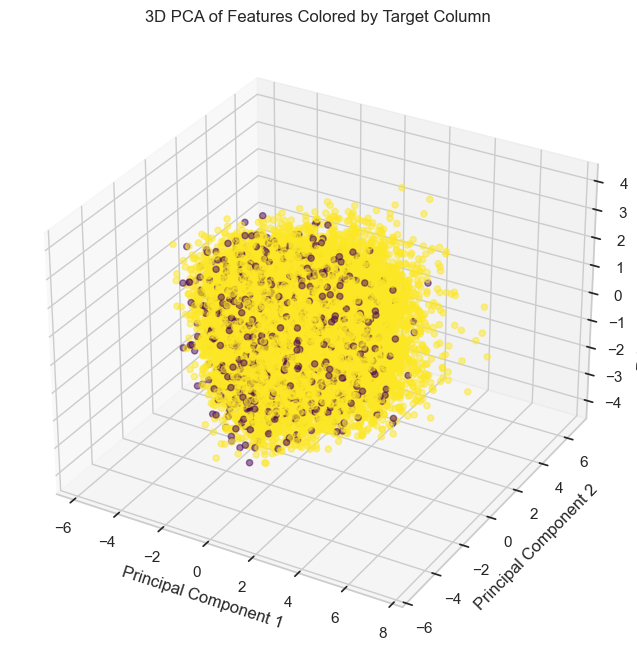

In [126]:
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=(10, 8))

ax = fig.add_subplot(111, projection='3d')
ax.scatter(principal_components[:, 0], principal_components[:, 1], principal_components[:, 2], c=train['target_column'], cmap='viridis', alpha=0.5)
ax.set_title('3D PCA of Features Colored by Target Column')
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
plt.colorbar(label='Target Column')
plt.show()

Using PCA does not give a good result either.

# Best Model

The best model seems to be the first decision tree model.

In [127]:
best_model = dt